In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
N = 32
T = 50
c = 0.7
r = 0.7
p_win = 0.5


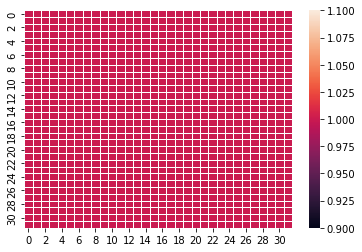

In [3]:
Agents = np.ones((N,N))

ax = sns.heatmap(Agents, linewidth=0.5)
plt.show()


for t in range(0):  # time units
    for n in range(N*N): # time steps
        
        # A has the risk and wants to buy insurance
        i_A = np.random.randint(0,N)
        j_A = np.random.randint(0,N)
        
        # B is considering to sell the insurance and take on the risk
        i_B, j_B = i_A, j_A
        while (i_B ==i_A) and (j_B==j_A):
            i_B = np.random.randint(0,N)
            j_B = np.random.randint(0,N)
         
        w_A = Agents[i_A,j_A]
        w_B = Agents[i_B, j_B]
        G = r*w_A
        C = c*w_A
            
        F_max = w_A - ((w_A + G)**0.5) * ((w_A-C)**0.5)
        
        F_min = -w_B  + 0.5*np.sqrt(4*w_B**2 + (G+C)**2 ) + (C-G)/2.
        #print("A:",w_A, F_max)
        #print("B:", w_B, F_min)
        #print("\n")
        
        p = np.random.uniform(0,1)
        win = p>0.5
        
        if (F_min >= F_max) or (w_B <= C): 
            # B demands more than A is willing to pay:
            # no contract
            
            if win:
                Agents[i_A, j_A] *= (1+r)
            else:
                Agents[i_A,j_A] *= (1-c)
                
                
        elif F_min < F_max and (w_B > C):
            # make a contract at midway fee
            F = 0.5*(F_min + F_max) 
            
            Agents[i_A,j_A] -= F 
            
            #print(F_min, F, F_max)
            #print(i_A, j_A, i_B, j_B)
            #print("\n")
            if win:
                Agents[i_B, j_B] += (F +  G)
            else:
                Agents[i_B, j_B] += (F-C)
            

            
    print("Time unit", t)
    print("Mean", np.mean(Agents))
    print("Median", np.median(Agents))
    ax = sns.heatmap(Agents, linewidth=0.5)
    plt.show()
    print("\n")

## Enumerate Indices

Start with an enumeration from 0 to N^2-1, then flatten this array. Use /N and %N and int() to retrieve the original indices from this 1d enumeration array. 

In [4]:
Enumeration = np.arange(0,N*N).reshape((N,N))

I, J = 5,3



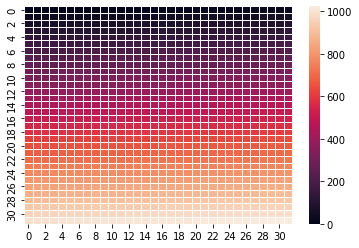

array([[   0,    1,    2, ...,   29,   30,   31],
       [  32,   33,   34, ...,   61,   62,   63],
       [  64,   65,   66, ...,   93,   94,   95],
       ...,
       [ 928,  929,  930, ...,  957,  958,  959],
       [ 960,  961,  962, ...,  989,  990,  991],
       [ 992,  993,  994, ..., 1021, 1022, 1023]])

In [5]:
sns.heatmap(Enumeration, linewidth = 0.5)
plt.show()
Enumeration

In [6]:

FlatEnumeration = Enumeration.flatten()
k = (FlatEnumeration / N).astype(int)
l =(FlatEnumeration% N).astype(int)

indices = np.empty((N*N,2))
indices[:,0] = k
indices[:,1] = l
indices

array([[ 0.,  0.],
       [ 0.,  1.],
       [ 0.,  2.],
       ...,
       [31., 29.],
       [31., 30.],
       [31., 31.]])

## Norms

Test out some distance norms on the array of indices. reshape((N,N)) retransforms this into a matrix depiction.

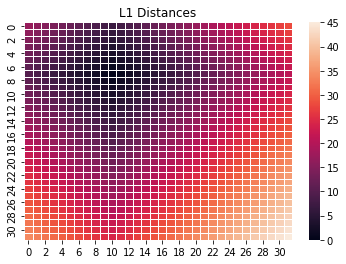

In [7]:
L1Norm  = abs(indices - np.array((7,10))).sum(axis = 1)
L1Norm.reshape((N,N))
ax = sns.heatmap(L1Norm.reshape((N,N)), linewidth=0.5)
plt.title("L1 Distances")
plt.show()

In [8]:
np.where(L1Norm == 0)

(array([234], dtype=int64),)

In [9]:
122%16, int(122/16)

(10, 7)

### Function

Function Flattened_to_2DIndex takes an array and integer and turns it into an 

In [10]:
def Flattened_to_2DIndex(Array, n):
    
    i_index = (Array/n).astype(int)
    j_index = Array%n
    output = np.empty((n*n,2))
    output[:,0] = i_index
    output[:,1] = j_index
    return(output)

In [11]:
Flattened_to_2DIndex(np.arange(5*5),5)

array([[0., 0.],
       [0., 1.],
       [0., 2.],
       [0., 3.],
       [0., 4.],
       [1., 0.],
       [1., 1.],
       [1., 2.],
       [1., 3.],
       [1., 4.],
       [2., 0.],
       [2., 1.],
       [2., 2.],
       [2., 3.],
       [2., 4.],
       [3., 0.],
       [3., 1.],
       [3., 2.],
       [3., 3.],
       [3., 4.],
       [4., 0.],
       [4., 1.],
       [4., 2.],
       [4., 3.],
       [4., 4.]])

In [12]:
ListIndices_not_i = list(Flattened_to_2DIndex(FlatEnumeration,N)[L1Norm != 0])
L = len(ListIndices_not_i)  # everything with nonzero norm, i.e. every OTHER point but "i"

In [13]:
Probab = (1/L1Norm[L1Norm!=0])**2 
Probab = Probab/sum(Probab)
chosen = np.random.choice(L, p = Probab)
chosen, ListIndices_not_i[chosen]

(172, array([ 5., 12.]))

In [14]:
Sample = np.zeros((N,N))

for trial in range(100):
    chosen = np.random.choice(L, p = Probab)
    chosen, ListIndices_not_i[chosen]
    
    Sample[ListIndices_not_i[chosen].astype(int)[0],
      ListIndices_not_i[chosen].astype(int)[1]] += 1

In [15]:
Sample

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

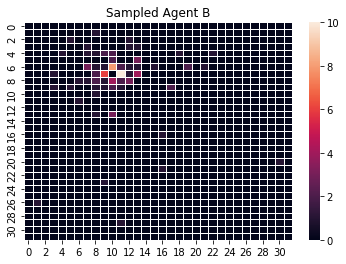

In [16]:
ax = sns.heatmap(Sample, linewidth=0.5)
plt.title("Sampled Agent B")
plt.show()

In [17]:
def Flattened_to_2DIndex(Array, n):
    '''
    Array: 1d enumeration of a previously n x n shaped array
    n: integer with len(Array) == n*n
    '''
    assert(len(Array) == n*n)
    i_index = (Array/n).astype(int)
    j_index = Array%n
    output = np.empty((n*n,2))
    output[:,0] = i_index
    output[:,1] = j_index
    return(output)



def Sample_Agent_B(N_agents, Indices_A, Exponent = 2):
    '''
    N_agents: integer (number of agents)
    Indices_A: 2d integer array (kth row of this array gives the x/y coordinates of agent k)
    Exponent: Measures how much the probabiliy decreases with distance to choose the distant agent
    '''
    
    # create 2d enumeration and flatten it
    Enumeration = np.arange(0,N_agents*N_agents).reshape((N_agents,N_agents))
    FlatEnumeration = Enumeration.flatten()
    
    # transform the flattened enumeration to (i,j) indices of the 2d map
    indices = Flattened_to_2DIndex(FlatEnumeration, N_agents)

    # Calculate the L1 Distances from the Indices of A
    Norm  = (abs(indices - Indices_A)**Exponent).sum(axis = 1)
    Norm.reshape((N_agents,N_agents))
    # Safety check
    #ax = sns.heatmap(Norm.reshape((N_agents,N_agents)), linewidth=0.5)
    #plt.title("Distances")
    #plt.show()
    
    # Now create a list of only those indices that are not A! We want to select a DIFFERENT agent B!
    ListIndices_not_A = list(indices[Norm != 0])
    L = len(ListIndices_not_A)
    
    # Probabilities ~ 1/(Norm) as a model suggestion
    Prob = (1/Norm[Norm!=0]) 
    Prob = Prob/sum(Prob)
    chosen = np.random.choice(L, p = Prob)
    
    # returns the indices of an agent B with B!=A and (statistically) B close to A
    return(ListIndices_not_A[chosen])
    

In [18]:
indices,(abs(indices - np.array([3,2]))**2).sum(axis = 1)

(array([[ 0.,  0.],
        [ 0.,  1.],
        [ 0.,  2.],
        ...,
        [31., 29.],
        [31., 30.],
        [31., 31.]]),
 array([  13.,   10.,    9., ..., 1513., 1568., 1625.]))

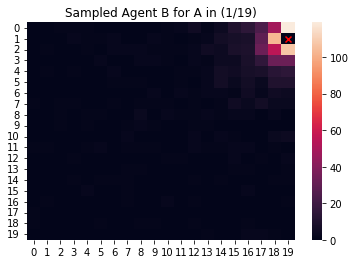

In [19]:
N_test = 20

Sample = np.zeros((N_test,N_test))

I = np.random.randint(0,N_test)
J = np.random.randint(0,N_test)
#print(I,J)
for trial in range(1000):
    chosen = np.random.choice(L, p = Probab)
    chosen, ListIndices_not_i[chosen]
    
    chosenindex = Sample_Agent_B(N_agents = N_test, Indices_A = np.array([I,J]).astype(int)).astype(int)
    #print(chosenindex)
    Sample[chosenindex[0],chosenindex[1]] += 1
    
ax = sns.heatmap(Sample)#, linewidth=0.5)
plt.scatter([J+0.5],[I+0.5],  c="red", marker="x")  # note that for plotting: x-axis is horizontal and hence the j value
                                                    # and y is vertical (i values): counterintuitive
plt.title("Sampled Agent B for A in ("+str(I)+"/"+str(J)+")")
plt.show()

#I,J

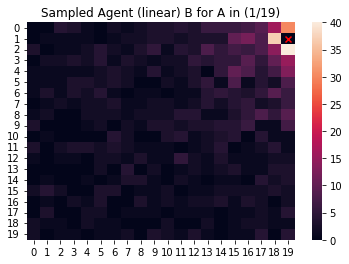

In [20]:
N_test = 20

Sample = np.zeros((N_test,N_test))

#print(I,J)
for trial in range(1000):
    chosen = np.random.choice(L, p = Probab)
    chosen, ListIndices_not_i[chosen]
    
    chosenindex = Sample_Agent_B(N_agents = N_test, 
                                 Indices_A = np.array([I,J]).astype(int),
                                 Exponent = 1).astype(int)
    #print(chosenindex)
    Sample[chosenindex[0],chosenindex[1]] += 1
    
ax = sns.heatmap(Sample)#, linewidth=0.5)
plt.scatter([J+0.5],[I+0.5],  c="red", marker="x")  # note that for plotting: x-axis is horizontal and hence the j value
                                                    # and y is vertical (i values): counterintuitive
plt.title("Sampled Agent (linear) B for A in ("+str(I)+"/"+str(J)+")")
plt.show()

#I,J

## Now Simulation with Spatial Probability

In [21]:
AgentsTimeSeries = np.ones((N,N,T))


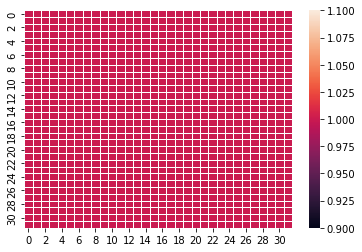

Time unit 0
Mean 0.9519150938744074
Median 0.7467436406404574
Number of contracts 757


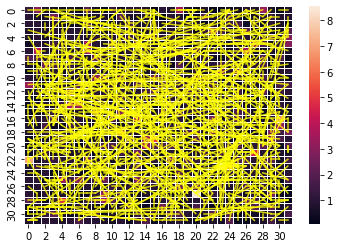

Mean Distance for Contract 5.2814277243350505


Time unit 1
Mean 0.9214788038716185
Median 0.5307072575685249
Number of contracts 635


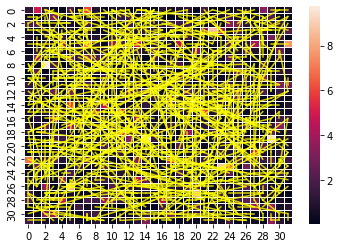

Mean Distance for Contract 5.168813220022119


Time unit 2
Mean 0.9290156253552193
Median 0.39422419427617594
Number of contracts 598


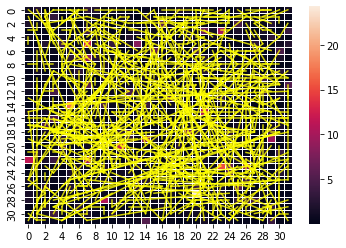

Mean Distance for Contract 5.257669428490558


Time unit 3
Mean 0.9531878308090994
Median 0.29572962355020826
Number of contracts 581


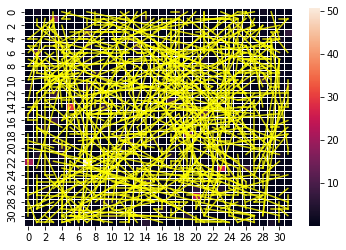

Mean Distance for Contract 5.355651194764685


Time unit 4
Mean 1.036237849966013
Median 0.2236472731004806
Number of contracts 607


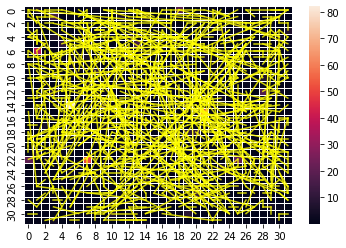

Mean Distance for Contract 5.358579185507238


Time unit 5
Mean 0.9790230180163326
Median 0.17758065307771836
Number of contracts 584


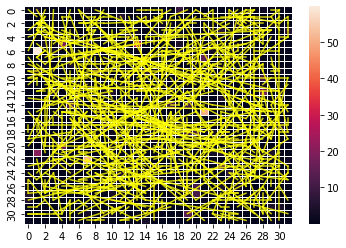

Mean Distance for Contract 5.069669597075297


Time unit 6
Mean 0.8396958549489637
Median 0.14205791585315386
Number of contracts 563


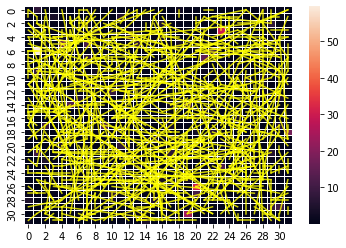

Mean Distance for Contract 5.5410791423702825


Time unit 7
Mean 0.8072796948336236
Median 0.11065298563924453
Number of contracts 574


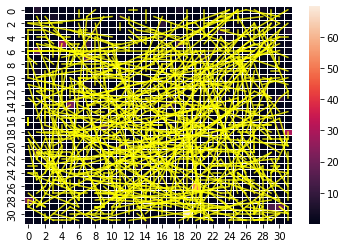

Mean Distance for Contract 5.531594069861979


Time unit 8
Mean 0.9096131783381485
Median 0.08158694668766106
Number of contracts 603


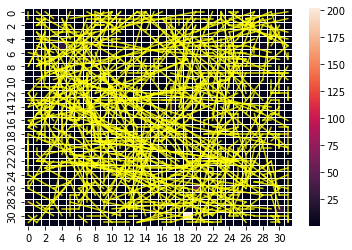

Mean Distance for Contract 5.14051631246096


Time unit 9
Mean 1.057290831164114
Median 0.057466823741108855
Number of contracts 561


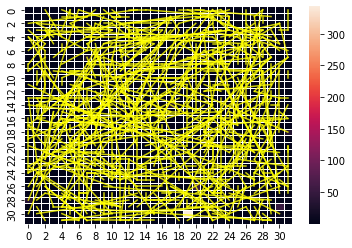

Mean Distance for Contract 5.420010981243286


Time unit 10
Mean 1.10755405392221
Median 0.04657260763529876
Number of contracts 550


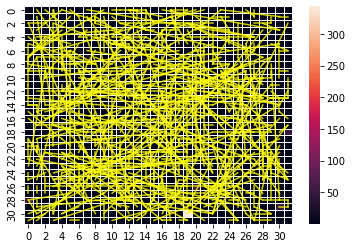

Mean Distance for Contract 5.591195674165437


Time unit 11
Mean 1.7289265273203716
Median 0.03362239752945997
Number of contracts 566


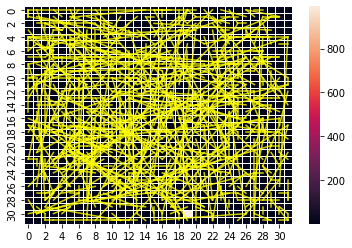

Mean Distance for Contract 5.3871121008002065


Time unit 12
Mean 1.1260932963187218
Median 0.024710537569867904
Number of contracts 556


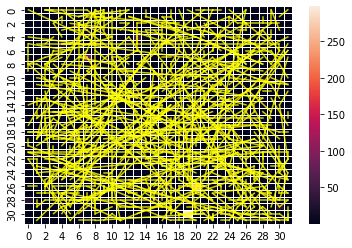

Mean Distance for Contract 5.2370554525726645


Time unit 13
Mean 0.76295180734175
Median 0.019880187538289164
Number of contracts 558


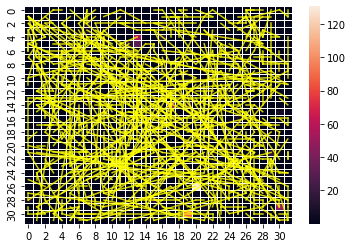

Mean Distance for Contract 5.355988274256428


Time unit 14
Mean 0.9861074410043389
Median 0.016608250422602056
Number of contracts 567


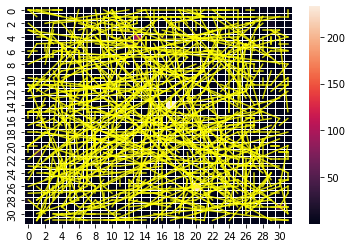

Mean Distance for Contract 5.7247240832022195


Time unit 15
Mean 1.0878344140156084
Median 0.013661996931166069
Number of contracts 574


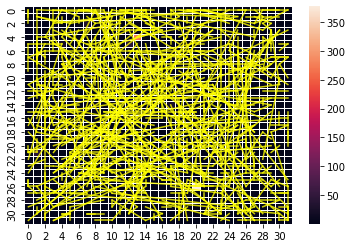

Mean Distance for Contract 5.623154709182657


Time unit 16
Mean 0.9480926686058442
Median 0.010264796929459655
Number of contracts 543


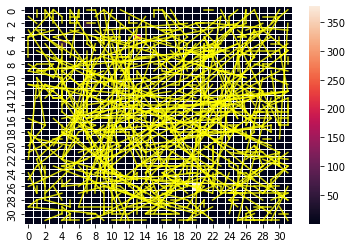

Mean Distance for Contract 5.151024806481649


Time unit 17
Mean 1.2959517704906178
Median 0.007543989090026421
Number of contracts 581


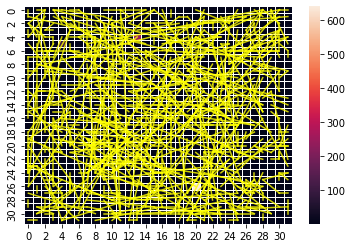

Mean Distance for Contract 5.327228272329948


Time unit 18
Mean 2.3116378380043106
Median 0.005683209976712018
Number of contracts 557


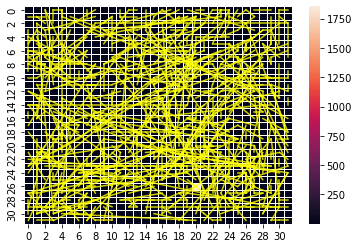

Mean Distance for Contract 4.8853265550851415


Time unit 19
Mean 2.3375340353774283
Median 0.004659758632292477
Number of contracts 569


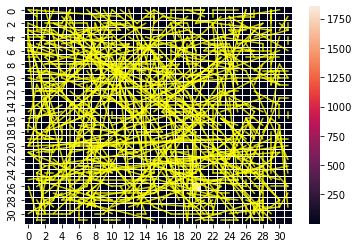

Mean Distance for Contract 5.24412409772151


Time unit 20
Mean 3.7255985476473246
Median 0.0038436405911636135
Number of contracts 570


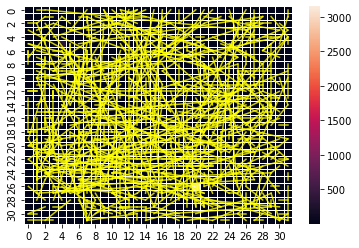

Mean Distance for Contract 5.356158018593457


Time unit 21
Mean 9.700951741102584
Median 0.0029082317479248733
Number of contracts 551


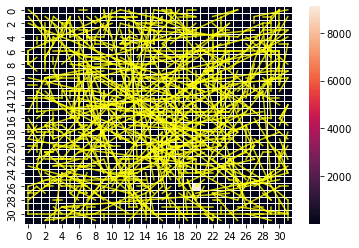

Mean Distance for Contract 4.976641793395279


Time unit 22
Mean 9.481016887536251
Median 0.0021726746755785535
Number of contracts 565


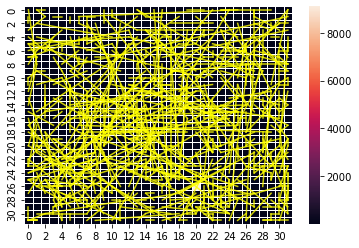

Mean Distance for Contract 4.869599484340465


Time unit 23
Mean 5.282744317433808
Median 0.0016472476005465776
Number of contracts 531


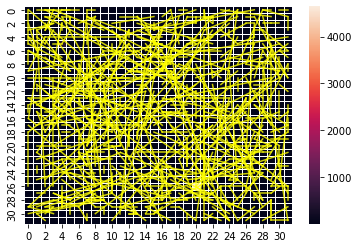

Mean Distance for Contract 5.172252860247112


Time unit 24
Mean 1.8955823197529418
Median 0.0013260929530784337
Number of contracts 565


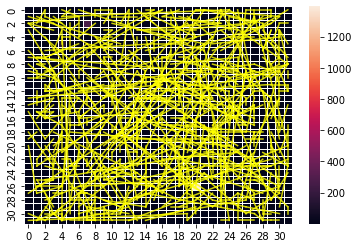

Mean Distance for Contract 5.213724447092048


Time unit 25
Mean 1.125391562819146
Median 0.000986536186155832
Number of contracts 524


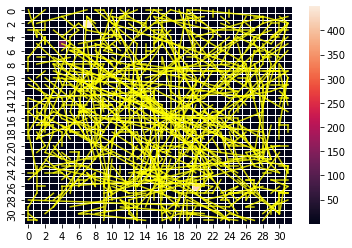

Mean Distance for Contract 5.040895455720501


Time unit 26
Mean 1.3112775406647448
Median 0.0007406832994804438
Number of contracts 543


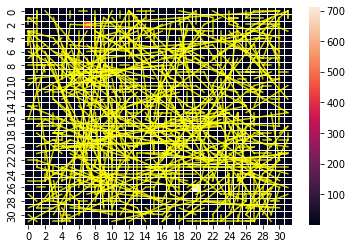

Mean Distance for Contract 5.192101382369914


Time unit 27
Mean 0.6623510671480592
Median 0.0006209649217293295
Number of contracts 559


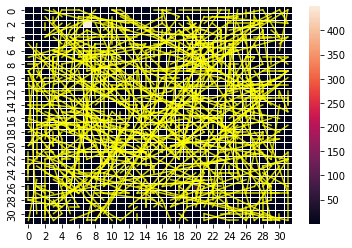

Mean Distance for Contract 5.279523200840446


Time unit 28
Mean 0.8002036212914114
Median 0.00045380093505262883
Number of contracts 559


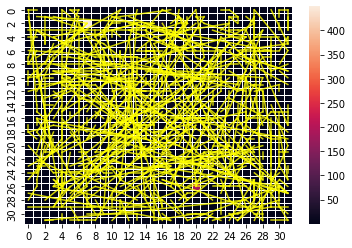

Mean Distance for Contract 5.364660335891832


Time unit 29
Mean 1.087931485001458
Median 0.0003450436750676185
Number of contracts 561


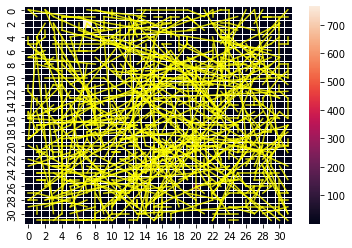

Mean Distance for Contract 5.039319445053379


Time unit 30
Mean 1.4881174840212523
Median 0.0002583034755461131
Number of contracts 530


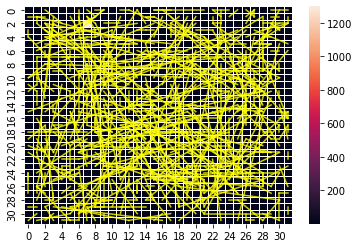

Mean Distance for Contract 5.110976240423187


Time unit 31
Mean 0.6241315441391797
Median 0.00020797237499801794
Number of contracts 566


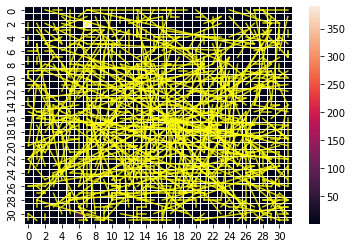

Mean Distance for Contract 5.207305360426159


Time unit 32
Mean 0.36249849693700564
Median 0.00015127254705742238
Number of contracts 553


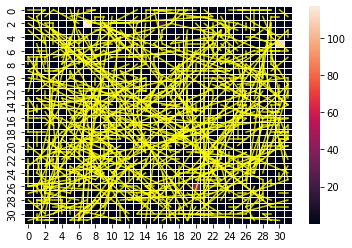

Mean Distance for Contract 5.1346776703024135


Time unit 33
Mean 0.4257097553581805
Median 0.00011219579540664405
Number of contracts 529


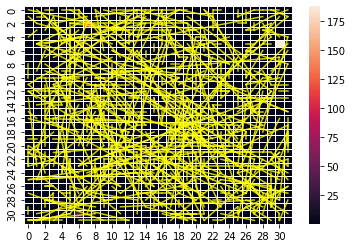

Mean Distance for Contract 5.137024973150928


Time unit 34
Mean 0.37557729860826516
Median 8.424832412709303e-05
Number of contracts 541


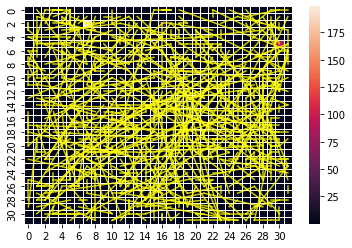

Mean Distance for Contract 5.015274366250667


Time unit 35
Mean 0.20909658079089785
Median 6.302817796674368e-05
Number of contracts 509


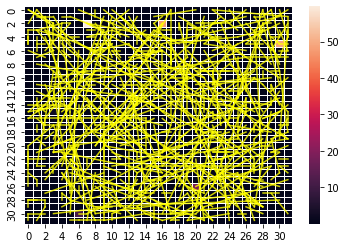

Mean Distance for Contract 5.313169517616594


Time unit 36
Mean 0.20513109950393904
Median 4.723565365986635e-05
Number of contracts 534


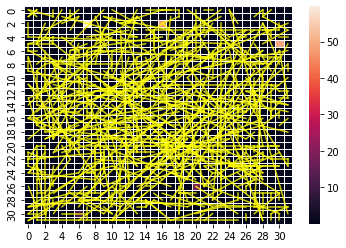

Mean Distance for Contract 5.260819486584575


Time unit 37
Mean 0.1689053292449746
Median 3.5548803703500974e-05
Number of contracts 527


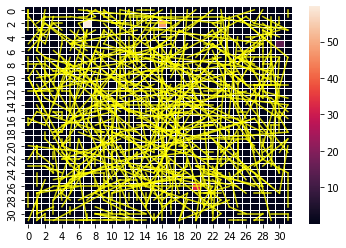

Mean Distance for Contract 5.063212789106774


Time unit 38
Mean 0.2456789448069974
Median 2.6955904639668973e-05
Number of contracts 555


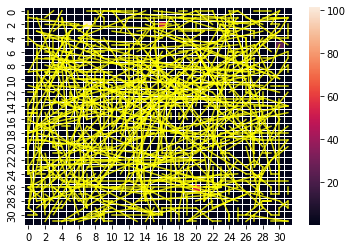

Mean Distance for Contract 5.621884549456811


Time unit 39
Mean 0.10172018977778717
Median 2.22199631570172e-05
Number of contracts 565


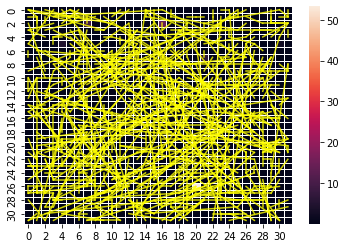

Mean Distance for Contract 5.421377779656576


Time unit 40
Mean 0.07311357742088084
Median 1.7033451160699682e-05
Number of contracts 547


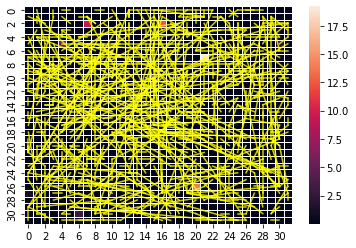

Mean Distance for Contract 5.105348640466024


Time unit 41
Mean 0.07352653846505404
Median 1.2529605618331957e-05
Number of contracts 550


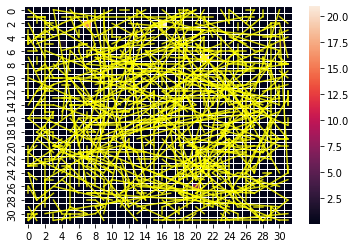

Mean Distance for Contract 5.022356434196782


Time unit 42
Mean 0.0705530594690523
Median 9.950340601320043e-06
Number of contracts 554


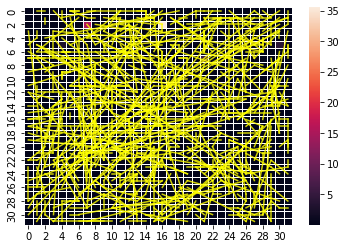

Mean Distance for Contract 4.90770571558947


Time unit 43
Mean 0.07208487221691504
Median 7.122845066434824e-06
Number of contracts 523


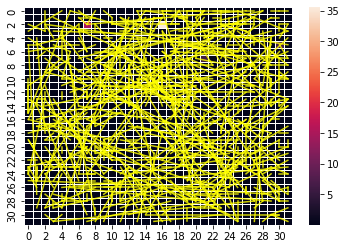

Mean Distance for Contract 5.520020587441827


Time unit 44
Mean 0.068399735622525
Median 5.404362539228059e-06
Number of contracts 563


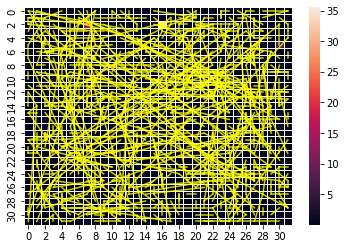

Mean Distance for Contract 4.963475758783601


Time unit 45
Mean 0.04949260599806863
Median 4.239316105972772e-06
Number of contracts 526


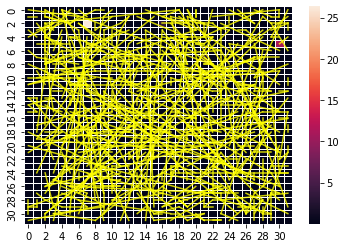

Mean Distance for Contract 5.614642919957424


Time unit 46
Mean 0.04643231333560954
Median 3.6600101517478934e-06
Number of contracts 539


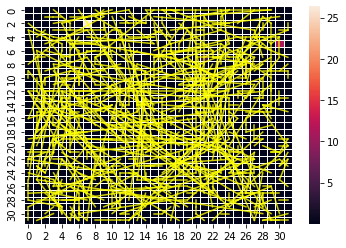

Mean Distance for Contract 4.948088164815033


Time unit 47
Mean 0.055003092135683745
Median 3.057254717389566e-06
Number of contracts 519


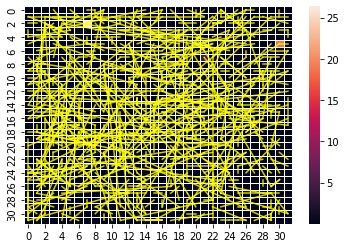

Mean Distance for Contract 4.924469105204583


Time unit 48
Mean 0.09395041344332863
Median 2.4201374492205705e-06
Number of contracts 562


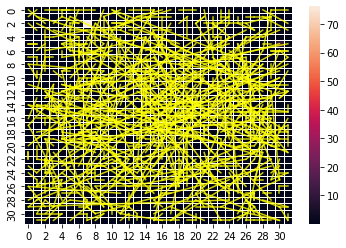

Mean Distance for Contract 5.336455591632169


Time unit 49
Mean 0.08530938214697063
Median 1.713724682024039e-06
Number of contracts 553


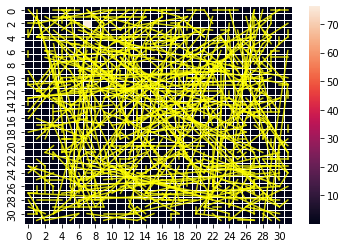

Mean Distance for Contract 5.483891025164277




In [22]:
AgentsTimeSeries = np.ones((N,N,T+1))

exponent = 2

Agents = np.ones((N,N))
AgentsTimeSeries[:,:,0] = Agents
ax = sns.heatmap(Agents, linewidth=0.5)
plt.show()


for t in range(T):  # time units
    
    Contracts = list()
    Distances = list()
    
    for n in range(N*N): # time steps
        
        
        
        # A has the risk and wants to buy insurance
        i_A = np.random.randint(0,N)
        j_A = np.random.randint(0,N)
        
        # B is considering to sell the insurance and take on the risk
        chosenindex = Sample_Agent_B(N_agents = N, 
                                 Indices_A = np.array([i_A,j_A]).astype(int),
                                 Exponent = exponent).astype(int)
        i_B = chosenindex[0]
        j_B = chosenindex[1]
         
        w_A = Agents[i_A,j_A]
        w_B = Agents[i_B, j_B]
        G = r*w_A
        C = c*w_A
            
        F_max = w_A - ((w_A + G)**0.5) * ((w_A-C)**0.5)
        
        F_min = -w_B  + 0.5*np.sqrt(4*w_B**2 + (G+C)**2 ) + (C-G)/2.
        #print("A:",w_A, F_max)
        #print("B:", w_B, F_min)
        #print("\n")
        
        p = np.random.uniform(0,1)
        win = p>p_win
        
        if (F_min >= F_max) or (w_B <= C): 
            # B demands more than A is willing to pay:
            # no contract
            
            if win:
                Agents[i_A, j_A] *= (1+r)
            else:
                Agents[i_A,j_A] *= (1-c)
                
                
        elif F_min < F_max and (w_B > C):
            # make a contract at midway fee
            F = 0.5*(F_min + F_max) 
            
            Agents[i_A,j_A] -= F 
            
            
            Contracts += [(i_A, j_A, i_B, j_B)]  # record the signed contract
            Distances += [ (abs(i_B - i_A)**exponent + abs(j_B-j_A)**exponent )**(1./exponent)  ]
            #print(Contracts[-1])
            #print(F_min, F, F_max)
            #print(i_A, j_A, i_B, j_B)
            #print("\n")
            if win:
                Agents[i_B, j_B] += (F +  G)
            else:
                Agents[i_B, j_B] += (F-C)
            

            
    print("Time unit", t)
    print("Mean", np.mean(Agents))
    print("Median", np.median(Agents))
    ax = sns.heatmap(Agents, linewidth=0.5)
    
    # now plot the contracts of this time unit
    
    print("Number of contracts", len(Contracts))
    
    for Indices in Contracts:
        i1, j1, i2, j2 = Indices
        #print([j1,i1], [j2,i2])
        plt.plot([j1+0.5,j2+0.5], [i1+0.5,i2+0.5], c = "yellow", alpha =0.8)
    #i1, j1, i2, j2 = Contracts[-1]
    #print([j1,i1], [j2,i2])
    #plt.plot([j1+0.5,j2+0.5], [i1+0.5,i2+0.5], c = "white")
    
    
    plt.show()
    print("Mean Distance for Contract", np.mean(np.array(Distances)))
    print("\n")
    
    AgentsTimeSeries[:,:,t+1] = Agents

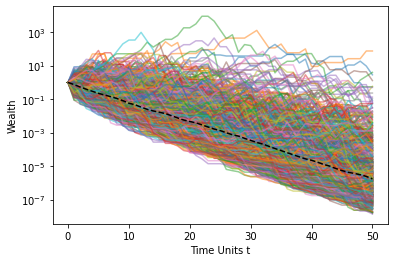

In [23]:
fig, ax = plt.subplots(1,1)
for i in range(N):
    for j in range(N):
        ax.semilogy(AgentsTimeSeries[i,j,:], alpha = 0.5)
        
medians = list()
for t in range(T+1):
    medians  += [np.median(AgentsTimeSeries[:,:,t])]
    
ax.semilogy(medians, c = "k", linestyle= "--")
ax.set_xlabel("Time Units t")
ax.set_ylabel("Wealth")
#ax.semilogy([0,T],[1,1], c="k")
plt.show()


## Boundary Condition for Norm 

No edges


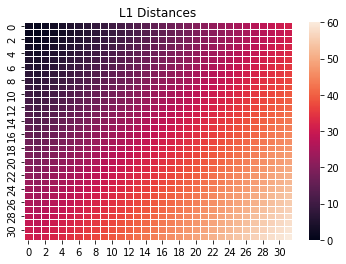

In [55]:
L1Norm  = abs(indices - np.array((1,1))).sum(axis = 1)
L1Norm.reshape((N,N))
ax = sns.heatmap(L1Norm.reshape((N,N)), linewidth=0.5)
plt.title("L1 Distances")
plt.show()

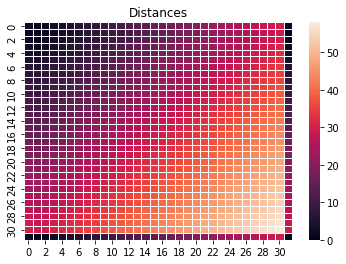

In [56]:
L1Norm  = (abs(indices - np.array((1,1)))%int(max(indices[:,0])-1)).sum(axis = 1)

abs(indices - np.array((1,1))

ax = sns.heatmap(L1Norm.reshape((N,N)), linewidth=0.5)
plt.title("Distances")
plt.show()

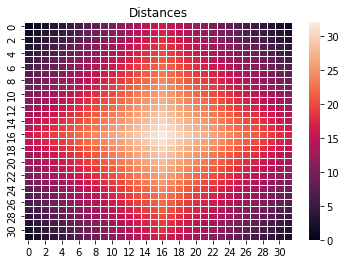

In [91]:
x_0, y_0 = 0,0

x,y = abs(indices - np.array((x_0, y_0)))[:,0], abs(indices - np.array((x_0, y_0)))[:,1]
x = np.where(x <= -x+N, x, -x+N) # Boundary Condition
y = np.where(y <= -y+N, y, -y+N)

NewNorm = x+y
ax = sns.heatmap(NewNorm.reshape((N,N)), linewidth=0.5)
plt.title("Distances")
plt.show()

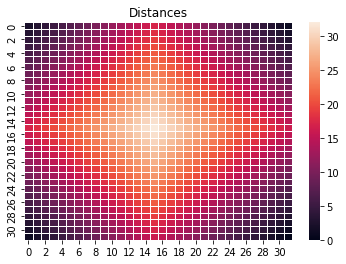

In [92]:
x_0, y_0 = 31,31

x,y = abs(indices - np.array((x_0, y_0)))[:,0], abs(indices - np.array((x_0, y_0)))[:,1]
x = np.where(x <= -x+N, x, -x+N) # Boundary Condition
y = np.where(y <= -y+N, y, -y+N)

NewNorm = x+y
ax = sns.heatmap(NewNorm.reshape((N,N)), linewidth=0.5)
plt.title("Distances")
plt.show()

In [88]:
type(x), type(-x+N), type(np.array([2,3]))
print(x, -x+N)
np.where(x <= -x+N, x, -x+N)

[ 7.  7.  7. ... 24. 24. 24.] [25. 25. 25. ...  8.  8.  8.]


array([7., 7., 7., ..., 8., 8., 8.])

In [62]:
int(N/2)
abs(indices - np.array((7,10)))

array([[ 7., 10.],
       [ 7.,  9.],
       [ 7.,  8.],
       ...,
       [24., 19.],
       [24., 20.],
       [24., 21.]])

In [120]:
def Flattened_to_2DIndex(Array, n):
    '''
    Array: 1d enumeration of a previously n x n shaped array
    n: integer with len(Array) == n*n
    '''
    assert(len(Array) == n*n)
    i_index = (Array/n).astype(int)
    j_index = Array%n
    output = np.empty((n*n,2))
    output[:,0] = i_index
    output[:,1] = j_index
    return(output)



def Sample_Agent_B(N_agents, Indices_A, Exponent = 2):
    '''
    N_agents: integer (number of agents)
    Indices_A: 2d integer array (kth row of this array gives the x/y coordinates of agent k)
    Exponent: Measures how much the probabiliy decreases with distance to choose the distant agent
    '''
    
    # create 2d enumeration and flatten it
    Enumeration = np.arange(0,N_agents*N_agents).reshape((N_agents,N_agents))
    FlatEnumeration = Enumeration.flatten()
    
    # transform the flattened enumeration to (i,j) indices of the 2d map
    indices = Flattened_to_2DIndex(FlatEnumeration, N_agents)

    # Calculate the L1 Distances from the Indices of A with boundary condition
    xA, yA =  Indices_A # agent A
    x,y = abs(indices - np.array((xA, yA)))[:,0], abs(indices - np.array((xA, yA)))[:,1] # distance to all other agents
    x = np.where(x <= -x+N_agents, x, -x+N_agents) # Boundary Condition
    y = np.where(y <= -y+N_agents, y, -y+N_agents)
    
    Norm  = np.where( x+y >0, x**Exponent + y**Exponent,0)
    Norm.reshape((N_agents,N_agents))
    # Safety check
    #ax = sns.heatmap(Norm.reshape((N_agents,N_agents)), linewidth=0.5)
    #plt.title("Distances")
    #plt.show()
    
    # Now create a list of only those indices that are not A! We want to select a DIFFERENT agent B!
    ListIndices_not_A = list(indices[Norm != 0])
    L = len(ListIndices_not_A)
    
    # Probabilities ~ 1/(Norm) as a model suggestion
    Prob = (1/Norm[Norm!=0]) 
    Prob = Prob/sum(Prob)
    print(Norm)
    print(Prob)
    chosen = np.random.choice(L, p = Prob)
    
    # returns the indices of an agent B with B!=A and (statistically) B close to A
    return(ListIndices_not_A[chosen])
    

[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.12

[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.12

[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.125 0.125 0.125 0.125 0.125]
[2. 0. 2. 2. 2. 2. 2. 2. 2.]
[0.125 0.125 0.125 0.12

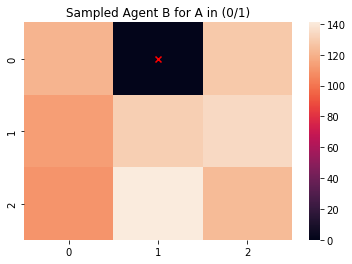

In [122]:
N_test = 3
expon = 0
Sample = np.zeros((N_test,N_test))

I = np.random.randint(0,N_test)
J = np.random.randint(0,N_test)
#print(I,J)
for trial in range(1000):
    chosen = np.random.choice(L, p = Probab)
    chosen, ListIndices_not_i[chosen]
    
    chosenindex = Sample_Agent_B(N_agents = N_test, Indices_A = np.array([I,J]).astype(int),Exponent = expon).astype(int)
    #print(chosenindex)
    Sample[chosenindex[0],chosenindex[1]] += 1
    
ax = sns.heatmap(Sample)#, linewidth=0.5)
plt.scatter([J+0.5],[I+0.5],  c="red", marker="x")  # note that for plotting: x-axis is horizontal and hence the j value
                                                    # and y is vertical (i values): counterintuitive
plt.title("Sampled Agent B for A in ("+str(I)+"/"+str(J)+")")
plt.show()

#I,J

[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

 0.0031805  0.00429179 0.00608815]
[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615

[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

 0.0031805  0.00429179 0.00608815]
[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615

 0.0031805  0.00429179 0.00608815]
[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615

[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615242  6.19615242  8.02457955
 10.392

 0.0031805  0.00429179 0.00608815]
[ 2.          1.          2.          3.82842712  6.19615242  9.
 12.18033989 15.69693846 19.52025918 23.627417   28.         32.6227766
 28.         23.627417   19.52025918 15.69693846 12.18033989  9.
  6.19615242  3.82842712  1.          0.          1.          2.82842712
  5.19615242  8.         11.18033989 14.69693846 18.52025918 22.627417
 27.         31.6227766  27.         22.627417   18.52025918 14.69693846
 11.18033989  8.          5.19615242  2.82842712  2.          1.
  2.          3.82842712  6.19615242  9.         12.18033989 15.69693846
 19.52025918 23.627417   28.         32.6227766  28.         23.627417
 19.52025918 15.69693846 12.18033989  9.          6.19615242  3.82842712
  3.82842712  2.82842712  3.82842712  5.65685425  8.02457955 10.82842712
 14.00876701 17.52536558 21.3486863  25.45584412 29.82842712 34.45120373
 29.82842712 25.45584412 21.3486863  17.52536558 14.00876701 10.82842712
  8.02457955  5.65685425  6.19615242  5.19615

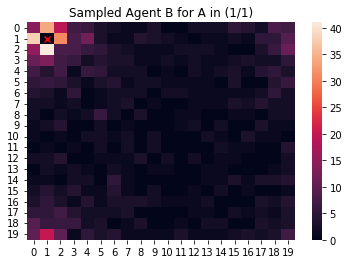

In [123]:
N_test = 20

Sample = np.zeros((N_test,N_test))

I = 1
J = 1
#print(I,J)
for trial in range(1000):
    chosen = np.random.choice(L, p = Probab)
    chosen, ListIndices_not_i[chosen]
    
    chosenindex = Sample_Agent_B(N_agents = N_test, Indices_A = np.array([I,J]).astype(int), Exponent = 1.5).astype(int)
    #print(chosenindex)
    Sample[chosenindex[0],chosenindex[1]] += 1
    
ax = sns.heatmap(Sample)#, linewidth=0.5)
plt.scatter([J+0.5],[I+0.5],  c="red", marker="x")  # note that for plotting: x-axis is horizontal and hence the j value
                                                    # and y is vertical (i values): counterintuitive
plt.title("Sampled Agent B for A in ("+str(I)+"/"+str(J)+")")
plt.show()

#I,J